# Install Dependencies

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 16614, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 16614 (delta 51), reused 58 (delta 27), pack-reused 16522
Receiving objects: 100% (16614/16614), 15.09 MiB | 25.71 MiB/s, done.
Resolving deltas: 100% (11410/11410), done.
/kaggle/working/yolov5
HEAD is now at 064365d8 Update parse_opt() in export.py to work as in train.py (#10789)


In [6]:
import os

# Change to the desired directory
os.chdir('/kaggle/working/yolov5')

# Verify the change by listing the files
!ls


CITATION.cff	 __pycache__	export.py	  runs	     tutorial.ipynb
CONTRIBUTING.md  benchmarks.py	hubconf.py	  segment    utils
LICENSE		 classify	invoice-1	  setup.cfg  val.py
README.md	 data		models		  state.db
README.zh-CN.md  detect.py	requirements.txt  train.py


In [7]:
# install dependencies as necessary
!cd /kaggle/working/yolov5
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.1.2 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


## Download  Dataset

The dataset of invoice images was collected from the publicly available dataset on Roboflow.

1. **Dataset Split**:
   - **Train Set**: Contains 80% of the images (586 images).
   - **Validation Set**: Comprises 10% of the images (74 images).
   - **Test Set**: Consists of 10% of the images (73 images).

2. **Preprocessing**:
   - **Auto-Orient**: Applied to the images.
   - **Resize**: Images were stretched to a resolution of 640x640 pixels.
   
Roboflow. (2024). Invoice data extraction Dataset. [Open Source Dataset] (https://universe.roboflow.com/roboflow-5gpbq/invoice-data-extraction). Retrieved from Roboflow Universe

**There are total 15 key points areas or classes that we used.**
1. Discount_Percentage
1. Due_Date
1. Email_Client
1. Name_Client
1. Products
1. Remise
1. Subtotal
1. Tax
1. Tax_Precentage
1. Tel_Client
1. billing address
1. invoice date
1. invoice number
1. shipping address
1. total


In [10]:
"""!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dQgawrplpp5UnueYoNTS")
project = rf.workspace("test-t1s3e").project("invoice-5wfdh")
version = project.version(1)
"""
dataset = version.download("yolov5")


In [11]:
%cd /kaggle/working/yolov5

/kaggle/working/yolov5


In [12]:
print(dataset.location)
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

/kaggle/working/yolov5/invoice-1
names:
- Discount_Percentage
- Due_Date
- Email_Client
- Name_Client
- Products
- Remise
- Subtotal
- Tax
- Tax_Precentage
- Tel_Client
- billing address
- invoice date
- invoice number
- shipping address
- total
nc: 15
roboflow:
  license: Public Domain
  project: invoice-5wfdh
  url: https://universe.roboflow.com/test-t1s3e/invoice-5wfdh/dataset/1
  version: 1
  workspace: test-t1s3e
test: ../test/images
train: invoice-1/train/images
val: invoice-1/valid/images


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.


In [14]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [15]:
#this is the model configuration we will use for our project
%cat /kaggle/working/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [16]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [17]:
%%writetemplate /kaggle/working/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes =15
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  
  [[-1, 1, Focus, [64, 3]],  
   [-1, 1, Conv, [128, 3, 2]],  
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone 
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone 
   [-1, 3, BottleneckCSP, [256, False]],  

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head 
   [-1, 3, BottleneckCSP, [512, False]],  

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  
   [-1, 3, BottleneckCSP, [1024, False]],  

   [[17, 20, 23], 1, Detect, [nc, anchors]],  
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [18]:
%%time
# train yolov5s on custom data for 100 epochs
# time its performance

%cd /kaggle/working/yolov5
!python train.py --img 640 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/kaggle/working/yolov5
2024-05-18 06:39:10.982057: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 06:39:10.982165: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 06:39:11.148179: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/kaggle/working/yolov5/invoice-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=2

# Evaluating Performance of Yolov5 from train/test dataset

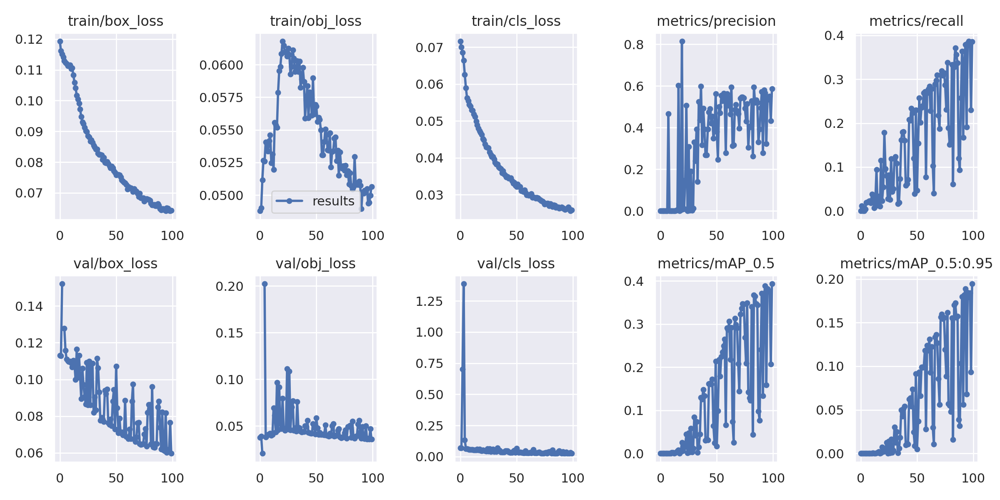

In [19]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/kaggle/working/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

### Visualize Our Training Data with Labels

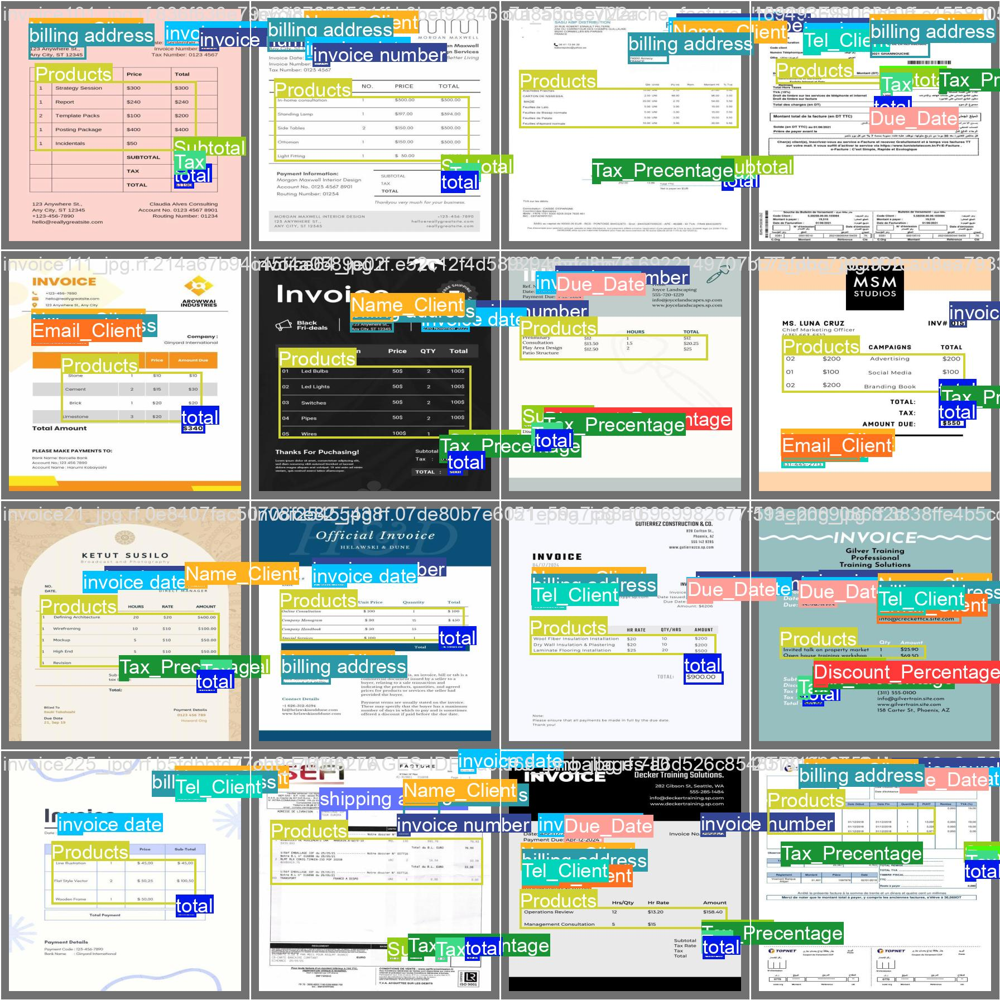

In [14]:
Image(filename='/kaggle/working/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


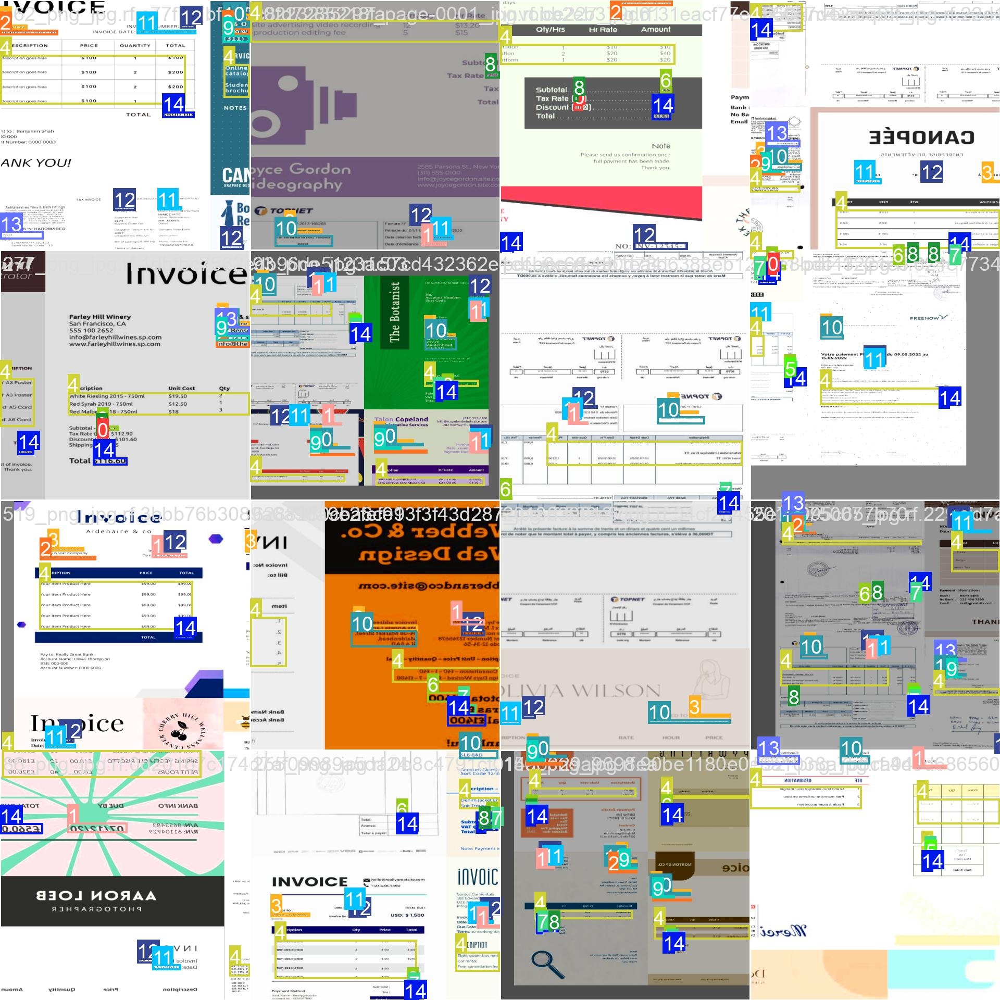

In [20]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/kaggle/working/yolov5/runs/train/yolov5s_results3/train_batch0.jpg', width=900)

**Frequency of different classes in train dataset**

Data Labels:


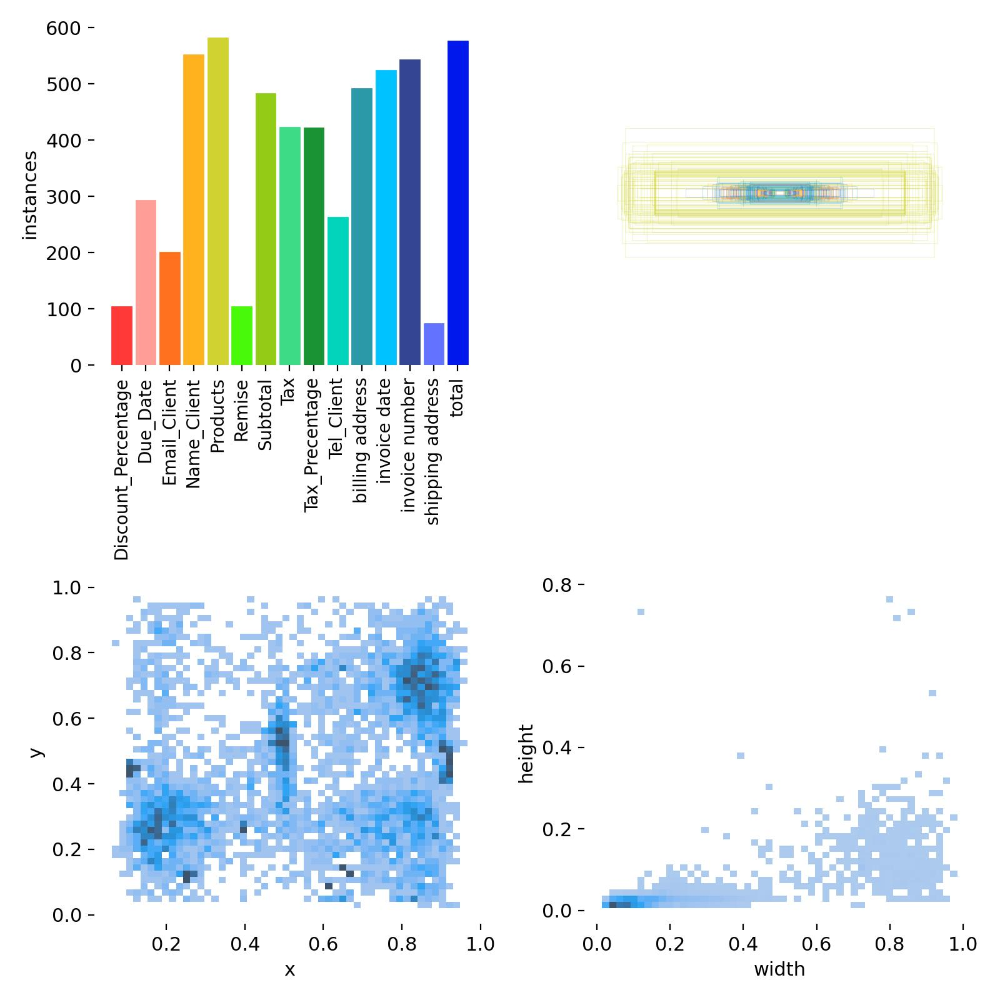

In [36]:
print("Data Labels:")
Image(filename='/kaggle/working/yolov5/runs/train/yolov5s_results3/labels.jpg', width=900)


# Training and Validation Results Analysis

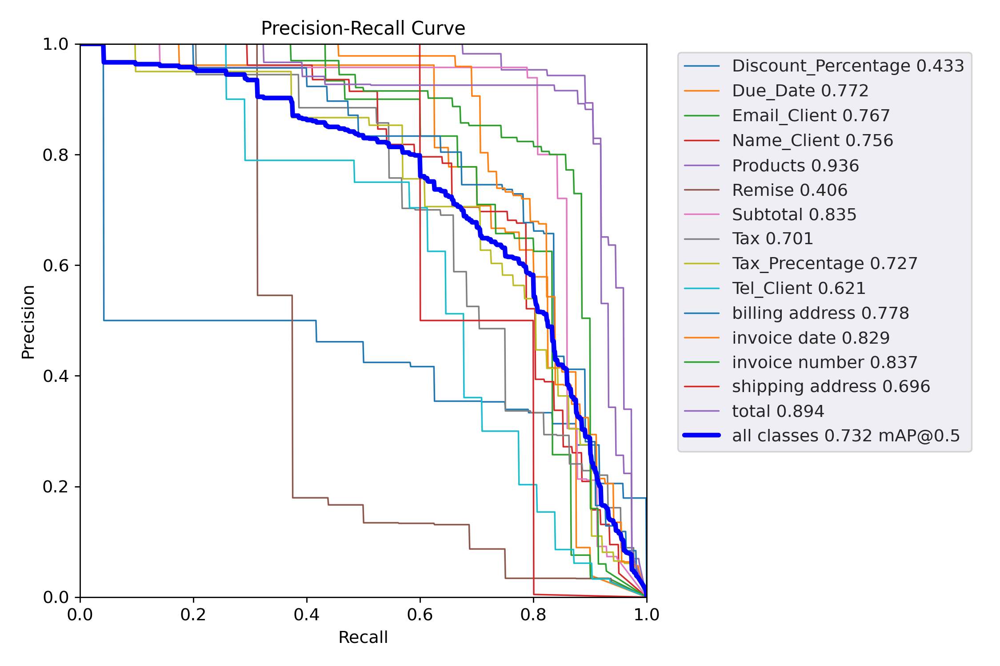

PR_curve.png


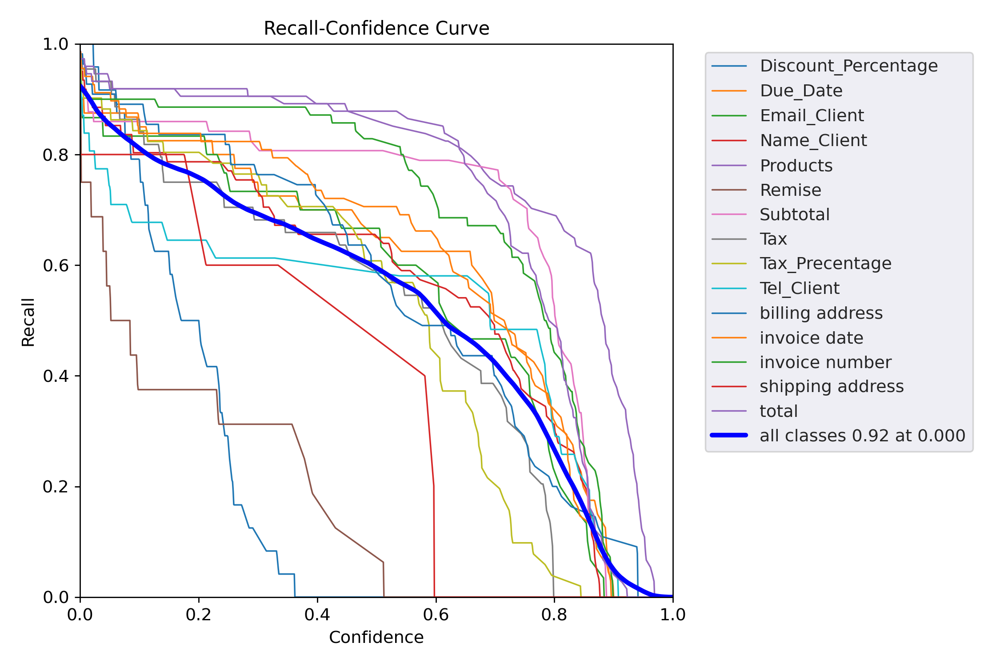

R_curve.png


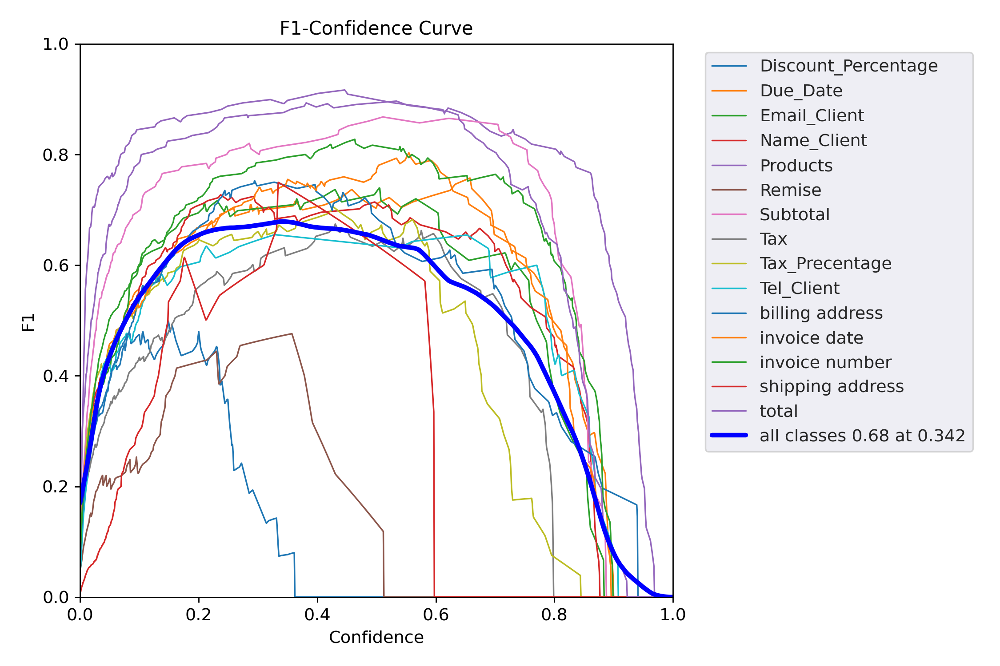

F1_curve.png


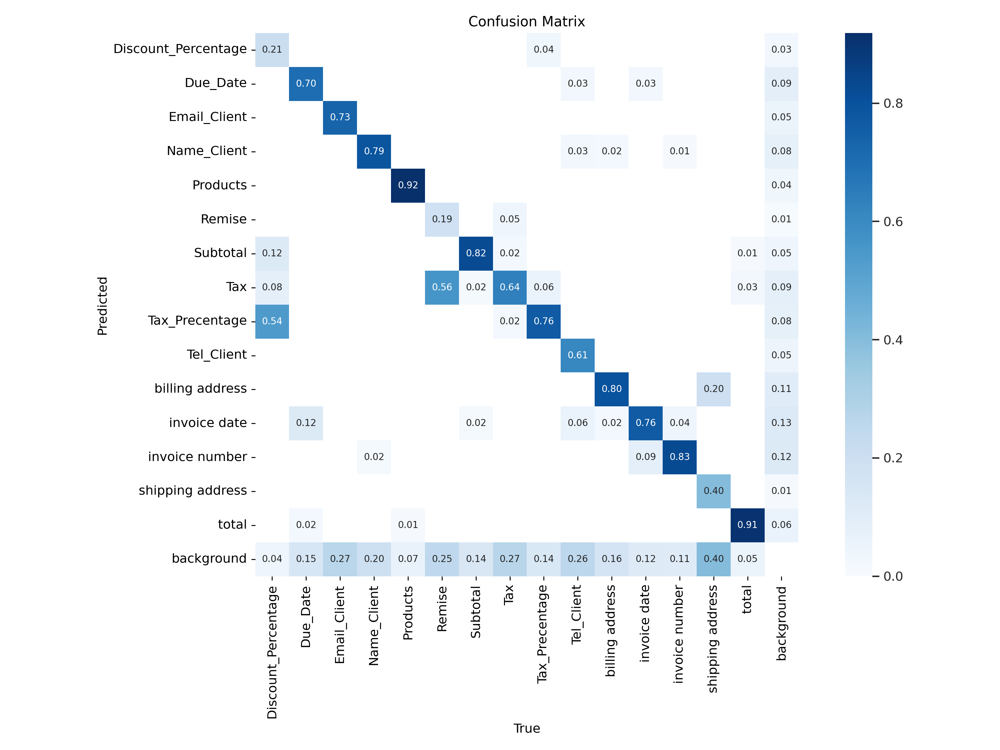

confusion_matrix.png


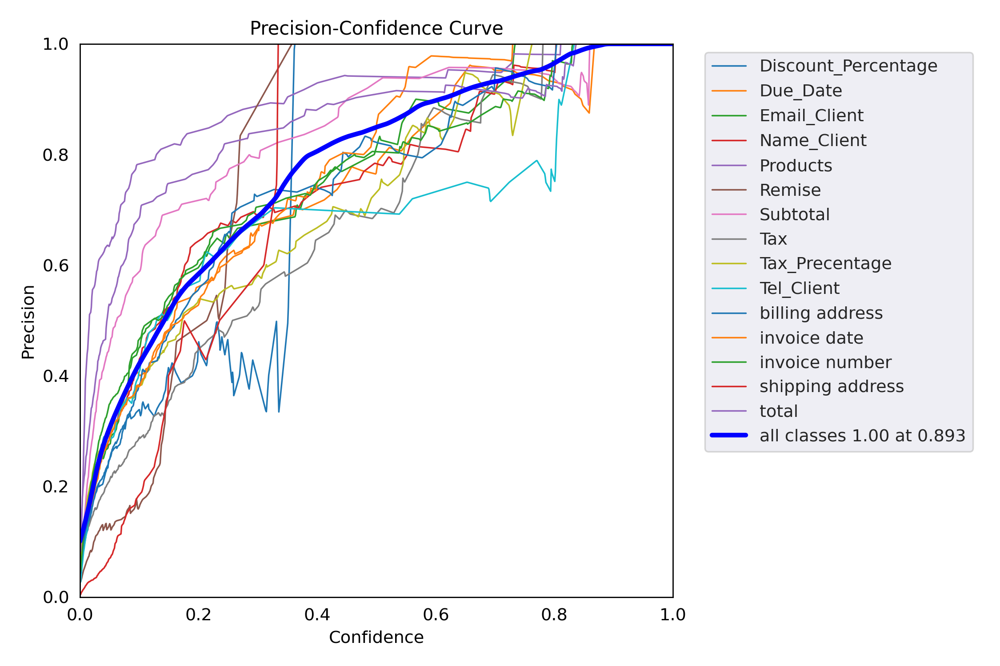

P_curve.png


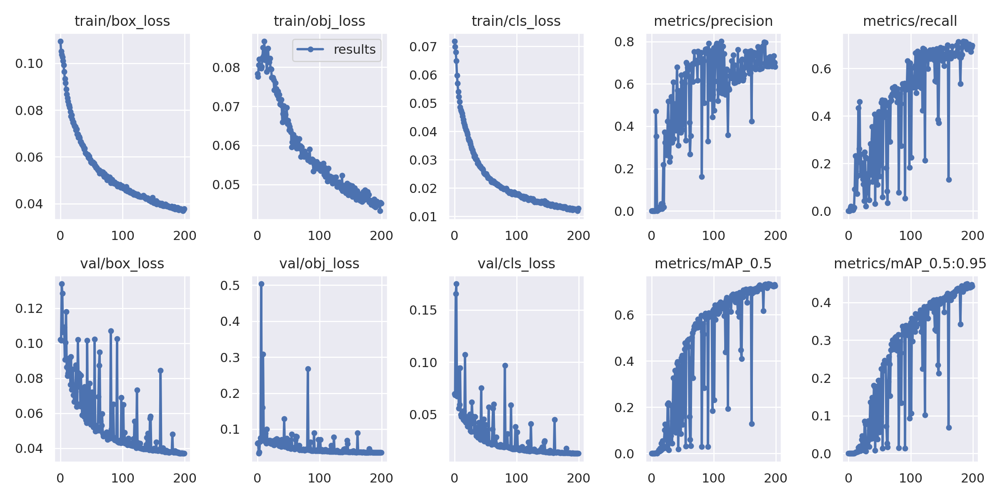

results.png


In [38]:
import glob
from IPython.display import display, Image

# Define the desired thumbnail size
thumbnail_width = 900
thumbnail_height = 900
html_code = ""
for imageName in glob.glob('/kaggle/working/yolov5/runs/train/yolov5s_results3/*.png')[:100]: #assuming JPG
    display(Image(filename=imageName, width=thumbnail_width, height=thumbnail_height))
    print(imageName.split("/")[-1])

# Run Inference With Trained Weights

Next, we can run inference with a pretrained checkpoint on all images in the `test/images` folder to understand how our model performs on our test set.

In [21]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/


In [28]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
%cd /kaggle/working/yolov5
!python detect.py --weights runs/train/yolov5s_results3/weights/best.pt --img 640 --view-img --save-crop --conf 0.4 --source /kaggle/working/yolov5/invoice-1/test/images

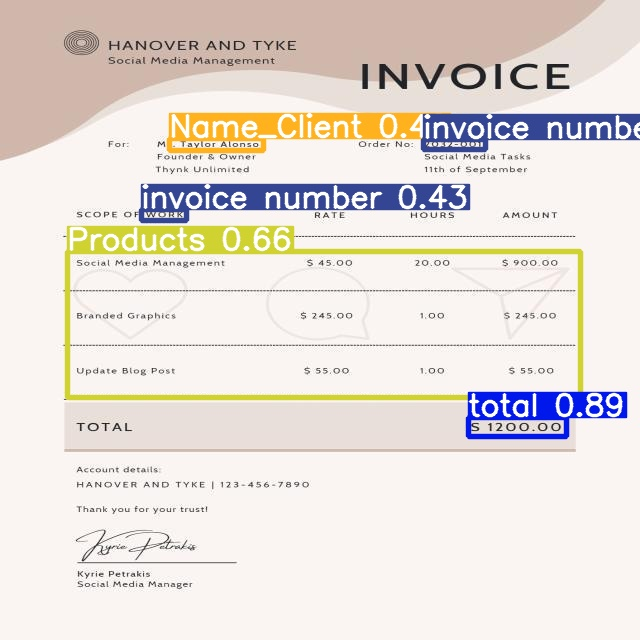

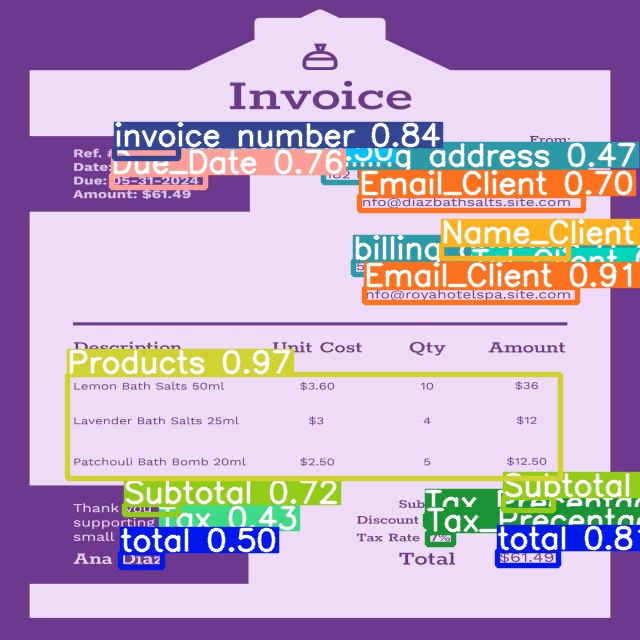

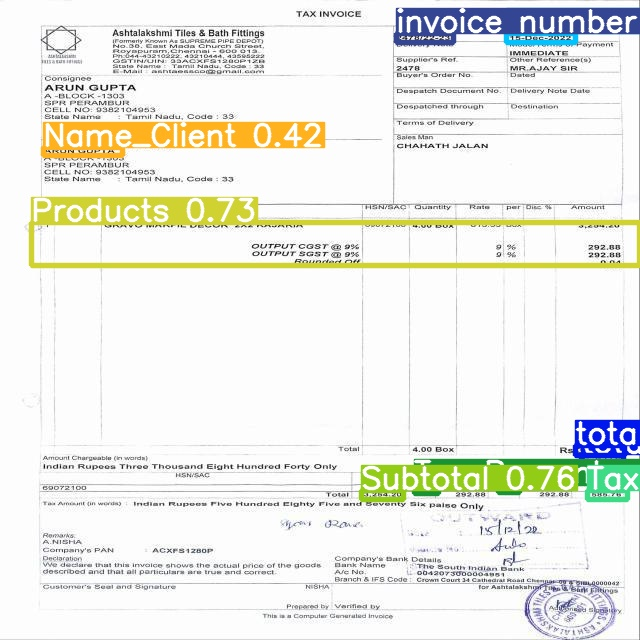

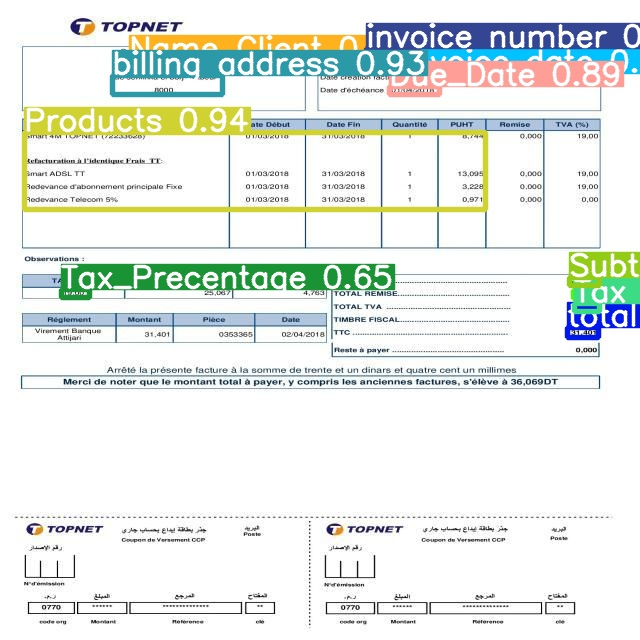

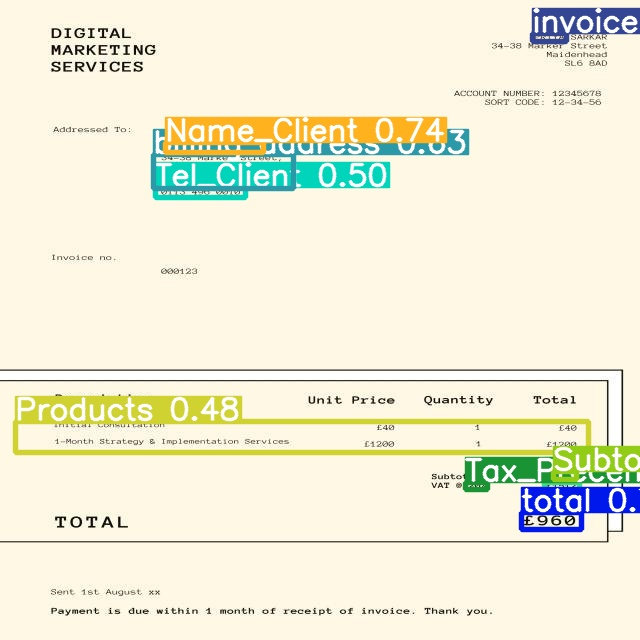

...

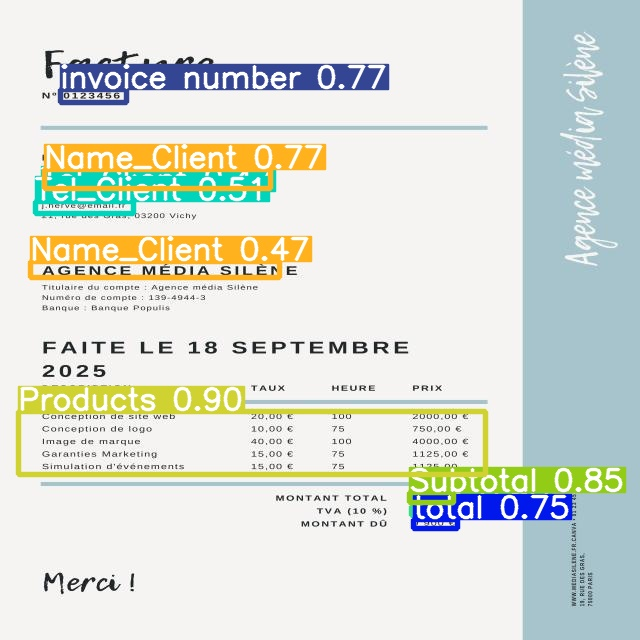

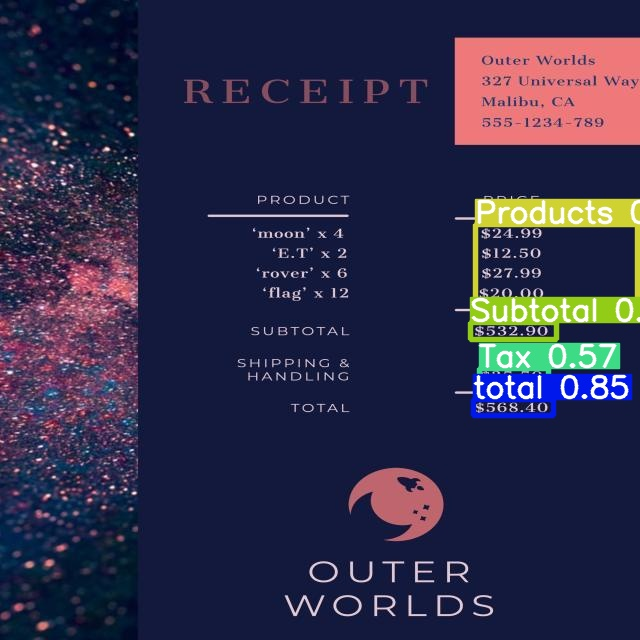

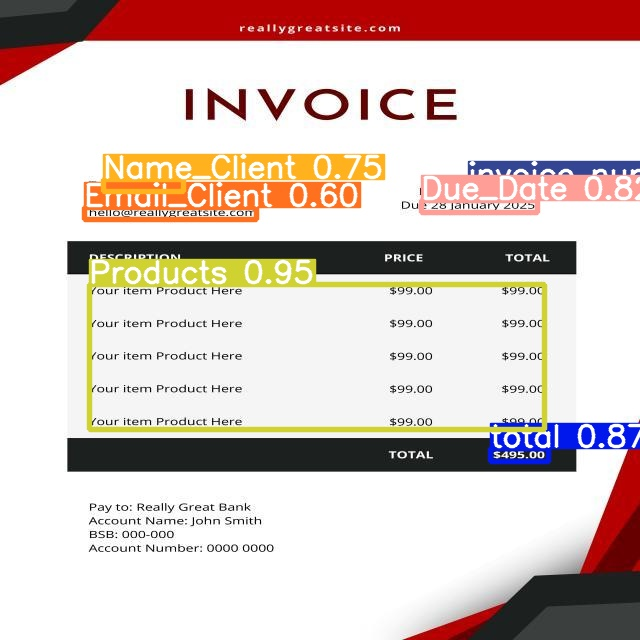

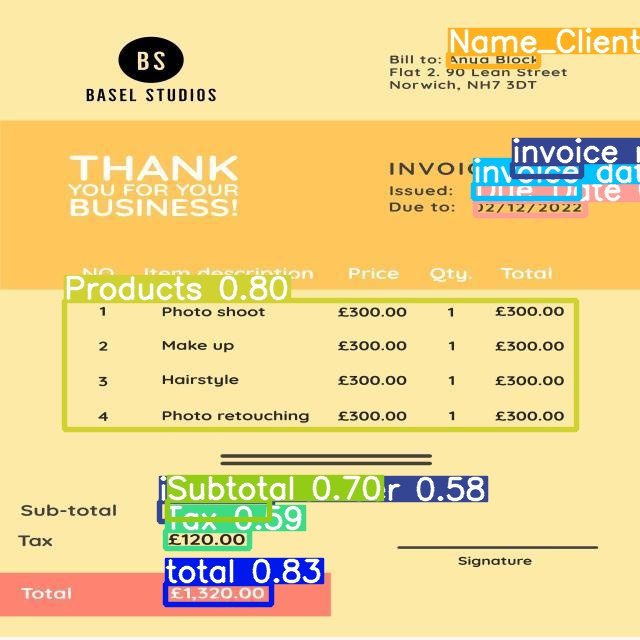

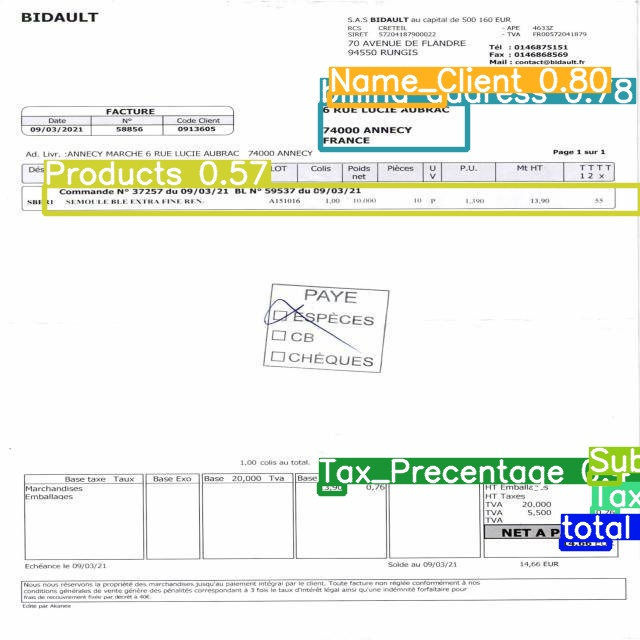

In [41]:
import glob
from IPython.display import display, Image

# Define the desired thumbnail size
thumbnail_width = 900
thumbnail_height = 900
html_code = ""
for imageName in glob.glob('runs/detect/exp5/*.jpg')[:100]: #assuming JPG
    display(Image(filename=imageName, width=thumbnail_width, height=thumbnail_height))
    


# Extracting data Using Tesseract From the cropped classes against each image

In [2]:
import os
import pytesseract
from PIL import Image

# Path to the detect folder
detect_folder = '/kaggle/working/yolov5/runs/detect/exp5'

# Path to the crops folder
crops_folder = os.path.join(detect_folder, 'crops')

# Iterate over each image in the detect folder
count = 0
for image_file in os.listdir(detect_folder):
    if image_file.endswith('.jpg') or image_file.endswith('.png'):
        image_path = os.path.join(detect_folder, image_file)
        image_name = os.path.splitext(image_file)[0]  # Extract the filename without extension
        
        # Iterate over each class folder in the crops folder
        print("_____________________________________________________________")
        print(image_name)
        for class_folder in os.listdir(crops_folder):
            class_path = os.path.join(crops_folder, class_folder)
            if os.path.isdir(class_path):
                class_text = []
                
                # Iterate over each image in the class folder
                for crop_file in os.listdir(class_path):
                    if os.path.splitext(crop_file)[0] == image_name:
                        if crop_file.endswith('.jpg') or crop_file.endswith('.png'):
                            crop_image_path = os.path.join(class_path, crop_file)

                            # Perform OCR on the crop image
                            try:
                                crop_text = pytesseract.image_to_string(Image.open(crop_image_path))
                                print(class_folder)
                                print(crop_text.strip())
                                print('-' * 30)  # Separator between texts
                            except Exception as e:
                                print(f"An error occurred during OCR for {crop_image_path}: {e}")
                            break
                    
    count+=1
    if count > 20:
        break


_____________________________________________________________
2625-Invoice-pdf_jpg.rf.75f6f3363f8f4366928e80ff6a00d6d8
Subtotal

------------------------------
Products

------------------------------
invoice number

------------------------------
total

------------------------------
invoice date

------------------------------
Tax_Precentage

------------------------------
shipping address

------------------------------
Tel_Client

------------------------------
Tax

------------------------------
billing address

------------------------------
Name_Client

------------------------------
_____________________________________________________________
3_png_jpg.rf.5dcb20c4f2325ff785f8531164163783
Subtotal

------------------------------
Products
eit

 

 

‘Service 1 2h 5000] 100,00] 10%] 10,00] 1
Description du Service 4
Produt 1 15L 1600) 27,00] 20% 5.40) 3

|Description du Produ 1
------------------------------
total

------------------------------
invoice date

--------------------

In [55]:
!pwd

/kaggle/working/yolov5
